In [97]:
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import ast
import os
import seaborn as sea
from hmmlearn import hmm
import random
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

plt.style.use('seaborn')

np.__version__

/tmp/ipykernel_23758/1881949867.py:11: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


'1.24.4'

## 2.2 Kernel Density Estimation

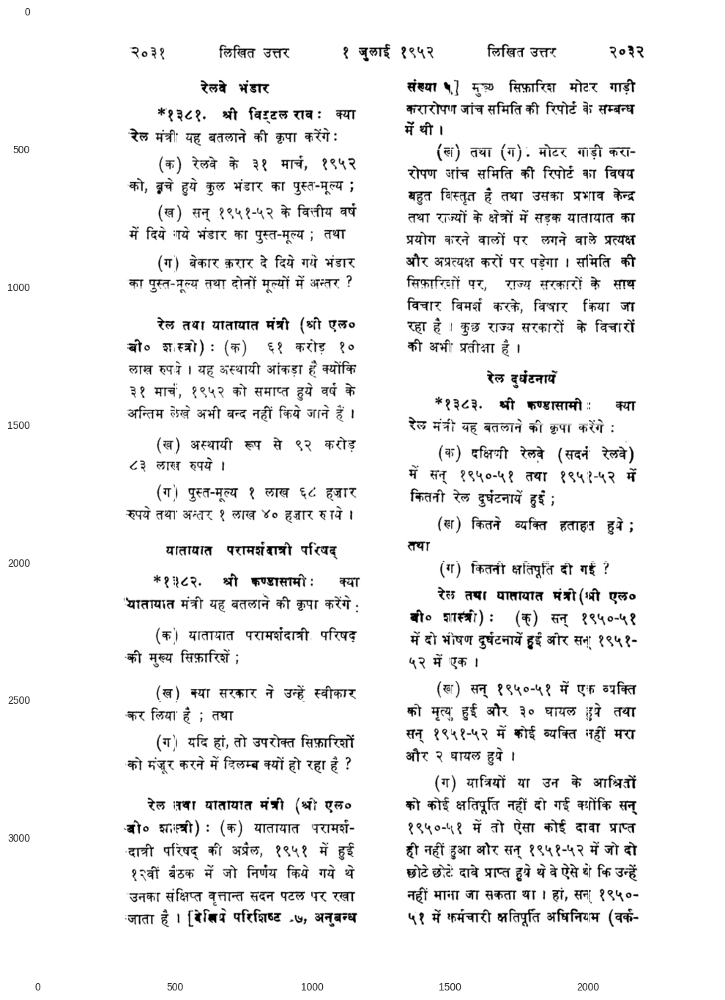

In [366]:
df = pd.read_csv('./data/CSV/TLBR_29.csv')
img = plt.imread('./data/images/29.jpg')
plt.figure(figsize=(12, 20))

plt.imshow(img)


0it [00:00, ?it/s]

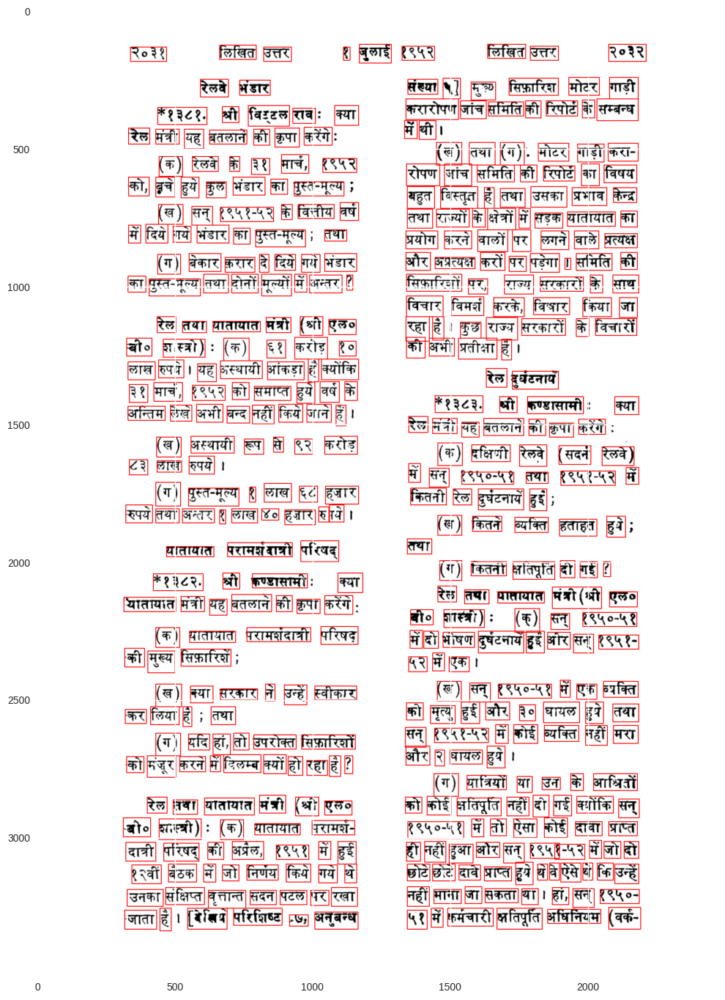

In [367]:
def visualize_bboxes(img, df, show = False):
    img_2 = img.copy()
    for index, rows in tqdm(df.iterrows()):
        top_left = (int(rows['Top-Left'].split(',')[0][1:]),int(rows['Top-Left'].split(',')[1][:-1]))
        bottom_right = (int(rows['Bottom-Right'].split(',')[0][1:]),int(rows['Bottom-Right'].split(',')[1][:-1]))
        cv2.rectangle(img_2, top_left, bottom_right, (255, 0, 0), 2)

    if show:
        plt.figure(figsize=(12, 20))
        plt.imshow(img_2)
        
    return img_2

img_boxes = visualize_bboxes(img, df, show=True)


In [368]:
df2 = df.copy()
df2['Top-Left'] = df['Top-Left'].apply(ast.literal_eval)
df2['Bottom-Right'] = df['Bottom-Right'].apply(ast.literal_eval)
df2

,Unnamed: 0,Top-Left,Bottom-Right,Id
0,0,"[338, 133]","[469, 185]",0
1,1,"[662, 126]","[795, 178]",1
2,2,"[822, 133]","[923, 185]",2
3,3,"[592, 250]","[694, 314]",3
4,4,"[735, 253]","[846, 308]",4
...,...,...,...,...
427,427,"[1431, 3257]","[1474, 3326]",427
428,428,"[1491, 3257]","[1656, 3322]",428
429,429,"[1670, 3257]","[1834, 3333]",429
430,430,"[1854, 3261]","[2047, 3312]",430


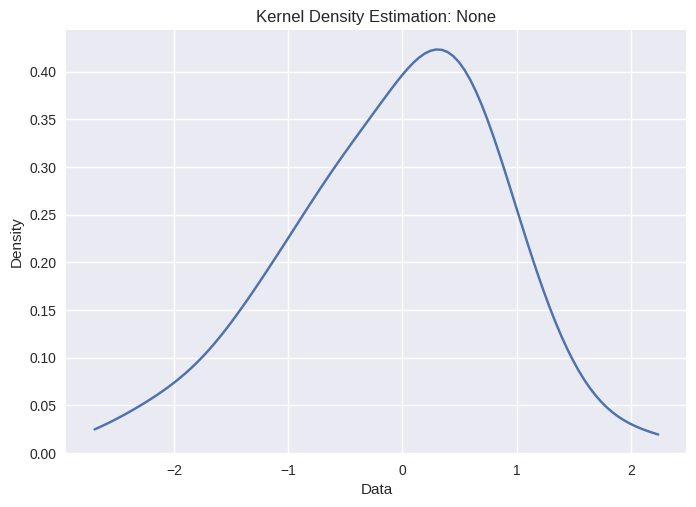

In [369]:

def gaussian_kernel(u):
    return (1/np.sqrt(2 * np.pi)) * np.exp(-0.5 * u**2)

def box_kernel(u):
    return np.where(np.abs(u) <= 1, 0.5, 0)

def triangular_kernel(u):
    return np.where(np.abs(u) <= 1, 1 - np.abs(u), 0)

class KDE:
    def __init__(self, kernel='gaussian'):
        self.kernel_map = {
            'gaussian': gaussian_kernel,
            'box': box_kernel,
            'triangular': triangular_kernel
        }
        self.kernel = self.kernel_map[kernel]
        self.data = None
        self.bandwidth = None

    def fit(self, data):
        self.data = np.atleast_2d(data)

    def select_bandwidth(self, bandwidth_range):
        best_bandwidth = None
        max_likelihood = -np.inf

        for bandwidth in bandwidth_range:
            likelihood = 0
            for i in range(self.data.shape[0]):
                leave_one_out_data = np.delete(self.data, i, axis=0)
                density = self._leave_one_out_density(self.data[i], leave_one_out_data, bandwidth)
                likelihood += np.log(density)

            if likelihood > max_likelihood:
                max_likelihood = likelihood
                best_bandwidth = bandwidth

        self.bandwidth = best_bandwidth

    def _leave_one_out_density(self, x, data, bandwidth):
        distances = cdist(data, [x]) / bandwidth
        kernel_values = self.kernel(distances).sum(axis=0)
        density = kernel_values / (len(data) * bandwidth)
        return density

    def evaluate_density(self, x):
        x = np.atleast_2d(x)
        distances = cdist(self.data, x) / self.bandwidth
        kernel_values = self.kernel(distances)
        density = kernel_values.sum(axis=0) / (len(self.data) * self.bandwidth)
        return density

    def visualize(self, x_range=None, num_points=100, title=None):
        if self.data.shape[1] != 1:
            print("Data is of higher dimension, can't plot it")
            
        if x_range is None:
            x_range = (self.data.min(), self.data.max())
        x = np.linspace(x_range[0], x_range[1], num_points)
        density = self.evaluate_density(x[:, None])
        plt.plot(x, density, label='KDE')
        plt.title(f'Kernel Density Estimation: {title}')
        plt.xlabel('Data')
        plt.ylabel('Density')
        
kde = KDE(kernel='gaussian')
data = np.random.normal(size=(100, 1)) 
kde.fit(data)

bandwidth_range = np.linspace(0.1, 1.0, 100) 
kde.select_bandwidth(bandwidth_range)

kde.visualize()

In [370]:
class WordCluster:
    def __init__(self, df):
        self.df = df
                
    # calculate euclidean distance 
    def calculate_distance(self, p, q):
        return (((p[0] - q[0]) ** 2) + ((p[1] - q[1]) ** 2)) ** 0.5
    
    # find ids of nearset boxes 
    def find_connection(self, p, idx, mid_fxn, show=False):
        dist, min_id = 1000000, 0
        distances = []
        
        for i in range(len(self.df)):
            if i == idx:
                continue
            d = self.calculate_distance(p, mid_fxn(i))
            if d < dist:
                dist = d
                min_id = i

        # if show:
        #     if dist < threshold:        
        #         cv2.line(self.img, p, mid_fxn(min_id), (0, 255, 0), 3)
        
        return dist, min_id
    
    # top mid coordinate
    def get_top_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (int((p[0] + q[0])/2), p[1])
    
    # bottom mid coordinate
    def get_bottom_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (int((p[0] + q[0])/2), q[1])
        
    # left mid coordinate
    def get_left_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (p[0], int((p[1] + q[1])/2))
    
    # right mid coordinate
    def get_right_mid(self, idx):
        p, q = self.df.iloc[idx, 1], self.df.iloc[idx, 2]
        return (q[0], int((p[1] + q[1])/2))
        
    def fit(self):
        self.hor_distances, self.ver_distances = [], []
        self.hor_ids, self.ver_ids = [], []
        
        for i in tqdm(range(len(self.df))):
            right_mid = self.get_right_mid(i)
            dist, id = self.find_connection(right_mid, i, self.get_left_mid)
            self.hor_distances.append(dist)
            self.hor_ids.append(id)
            
            bottom_mid = self.get_bottom_mid(i)
            dist, id = self.find_connection(bottom_mid, i, self.get_top_mid)
            self.ver_distances.append(dist)
            self.ver_ids.append(id)
            
    def draw_boxes(self, img, ver_treshold, hor_threshold):
        
        for i in range(len(self.df)):
            dist, id = self.hor_distances[i], self.hor_ids[i]
            p = self.get_right_mid(i)
            if dist < hor_threshold:
                cv2.line(img, p, self.get_left_mid(id), (0, 0, 255), 3)

        for i in range(len(self.df)):
            dist, id = self.ver_distances[i], self.ver_ids[i]
            p = self.get_bottom_mid(i)
            if dist < ver_treshold:
                cv2.line(img, p, self.get_top_mid(id), (0, 255, 0), 3)

        return img

In [371]:
wc = WordCluster(df2)
wc.fit()

  0%|          | 0/432 [00:00<?, ?it/s]

In [372]:
def plot_kde(data, title, bandwidth_range=np.linspace(1, 50, 100)):
    kde = KDE(kernel='gaussian')
    kde.fit(data)
    kde.select_bandwidth(bandwidth_range)
    kde.visualize(title=title)

/tmp/ipykernel_23758/2313881581.py:39: RuntimeWarning: divide by zero encountered in log
  likelihood += np.log(density)


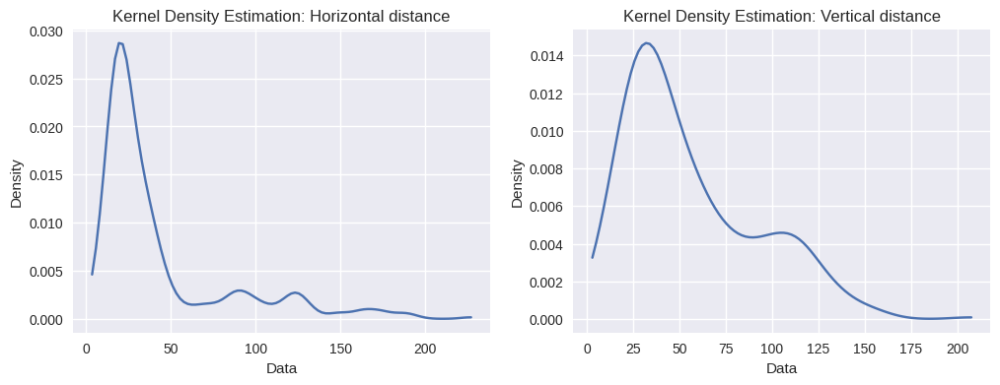

In [373]:

plt.figure(figsize=(12, 4))

plt.subplot(1,2,1)
plot_kde(np.array(wc.hor_distances).reshape(-1,1), title='Horizontal distance')

plt.subplot(1,2,2)
plot_kde(np.array(wc.ver_distances).reshape(-1,1), title='Vertical distance')


### Observations
From the above, we can have the following observation:

1. The first peak corresponds to the distances of boxes inside a paragraph.
2. Then, there is a sharp dip which denotes the empty space between two paragraphs.
3. Finally, there is another peak which denotes a paragraph closest to where we are now.

Hence, it would be optimal for the threshold to be some value just less than the second peak.

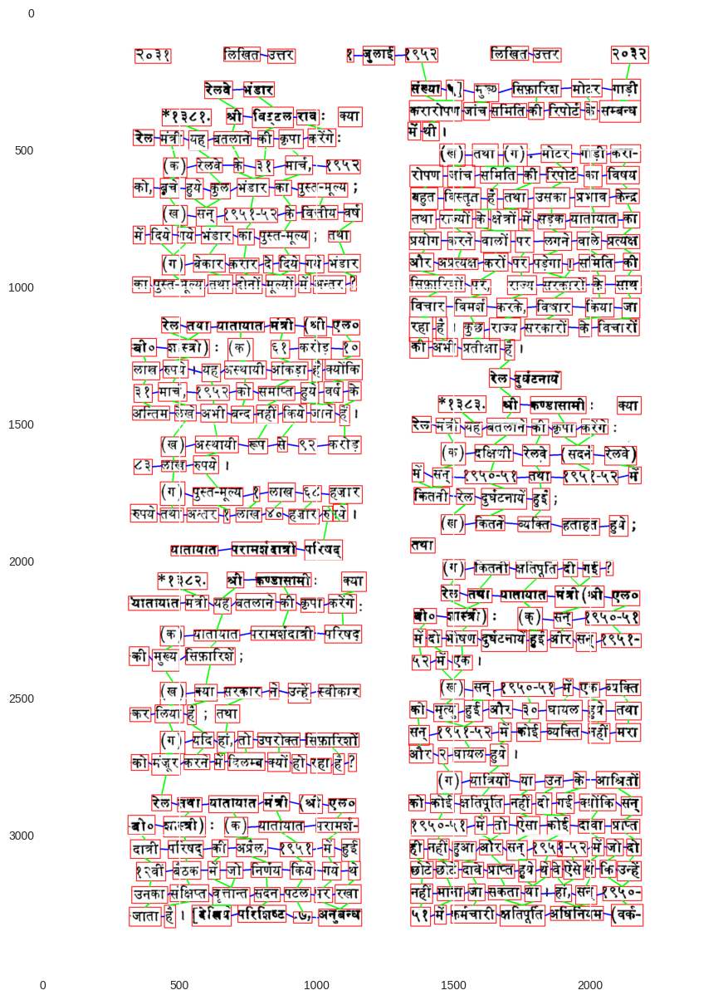

In [376]:
img = wc.draw_boxes(img_boxes.copy(), ver_treshold=75, hor_threshold=55)
plt.figure(figsize=(30, 15))
plt.imshow(img)

In [383]:
def visualize_results(df, img, ver_treshold, hor_treshold, bandwidth_range=np.linspace(1, 50, 100)):
    wc = WordCluster(df)
    wc.fit()
    
    plt.figure(figsize=(12, 4))
    plt.subplot(1,2,1)
    plot_kde(np.array(wc.hor_distances).reshape(-1,1), title='Horizontal distance', bandwidth_range=bandwidth_range)
    plt.subplot(1,2,2)
    plot_kde(np.array(wc.ver_distances).reshape(-1,1), title='Vertical distance', bandwidth_range=bandwidth_range)
    plt.show()

    plt.figure(figsize=(20, 15))    
    plt.subplot(1,2,1)
    img_result = wc.draw_boxes(img.copy(), ver_treshold=ver_treshold, hor_threshold=hor_treshold)
    plt.imshow(img_result)
    plt.subplot(1,2,2)
    plt.imshow(img)
    plt.show()
    

### Experimenting with different bandwidth values: [5, 20, 50]

File: 29


0it [00:00, ?it/s]

Experimenting with different bandwidth values


  0%|          | 0/432 [00:00<?, ?it/s]

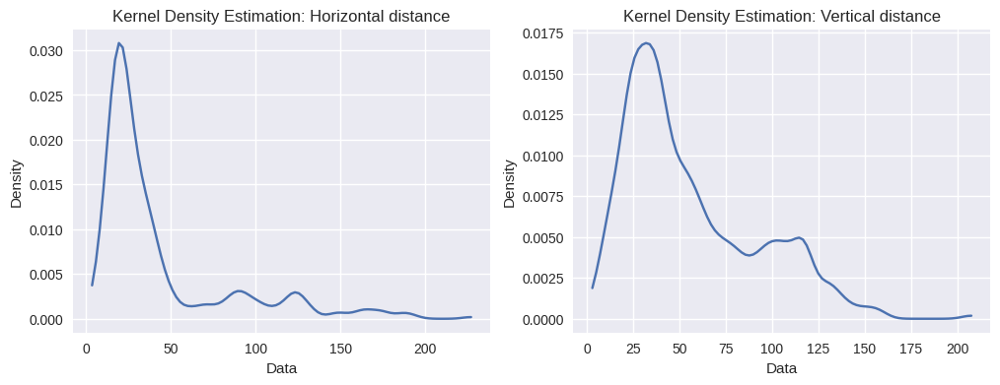

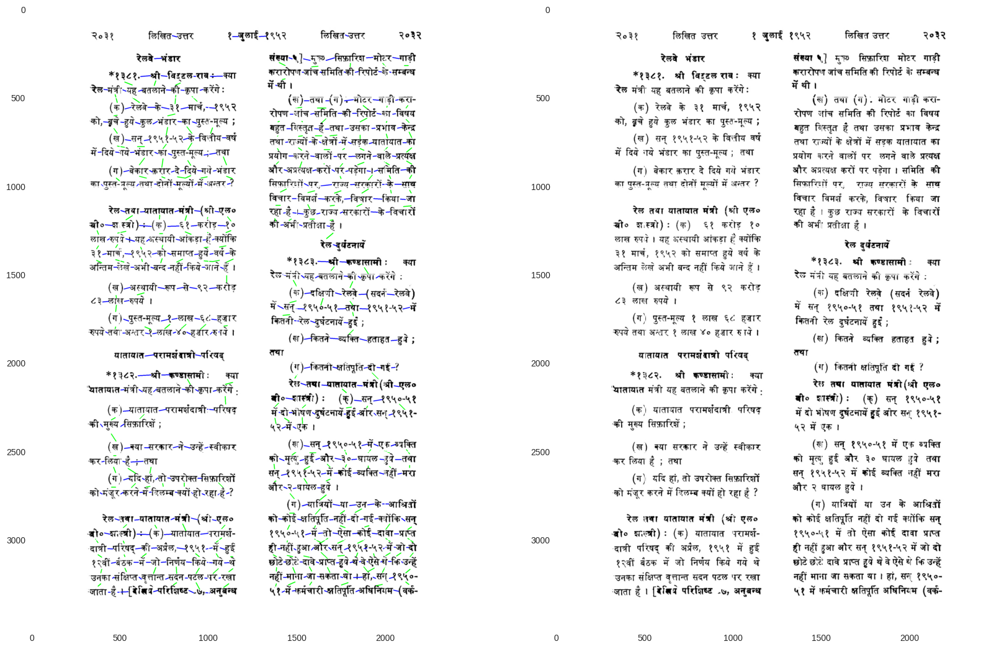

  0%|          | 0/432 [00:00<?, ?it/s]

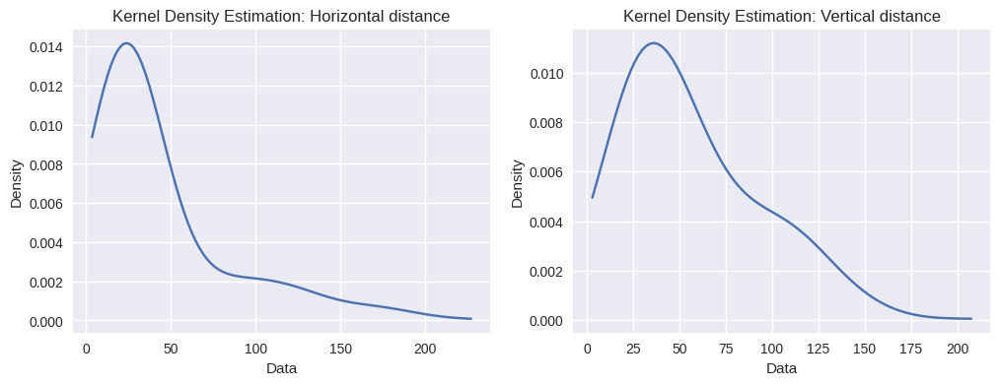

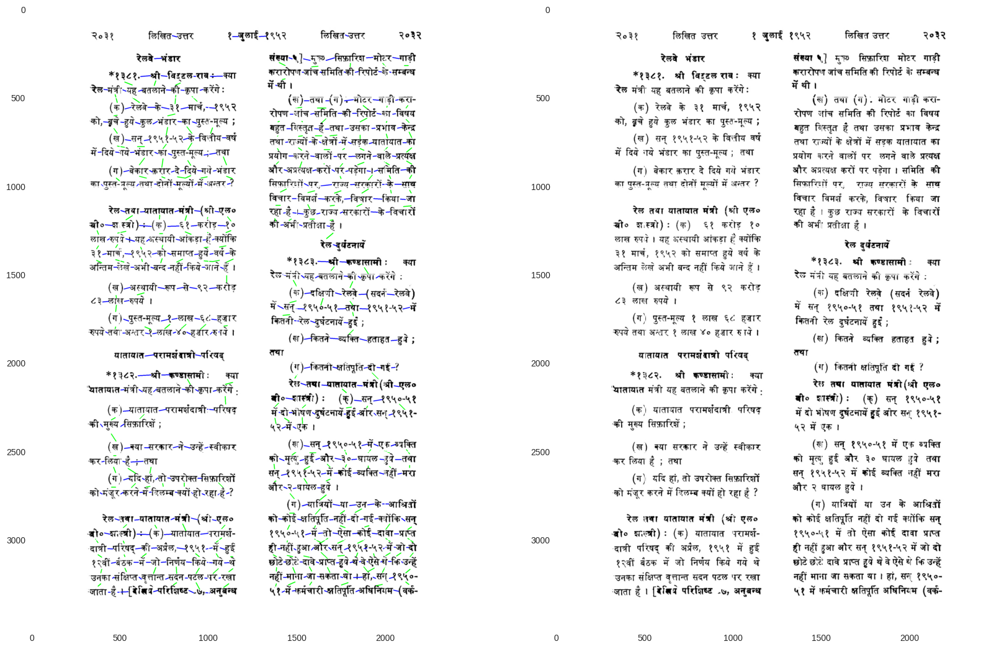

  0%|          | 0/432 [00:00<?, ?it/s]

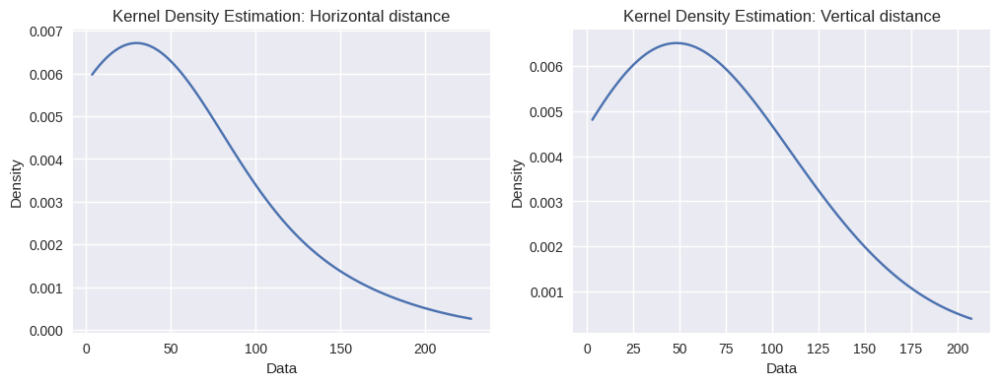

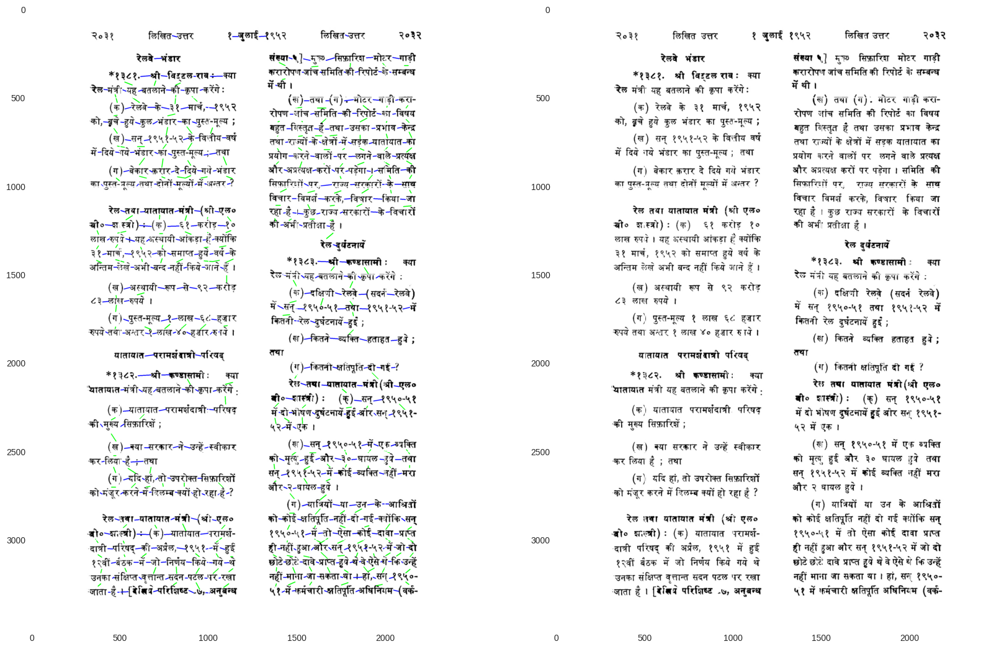

File: 68


0it [00:00, ?it/s]

Experimenting with different bandwidth values


  0%|          | 0/498 [00:00<?, ?it/s]

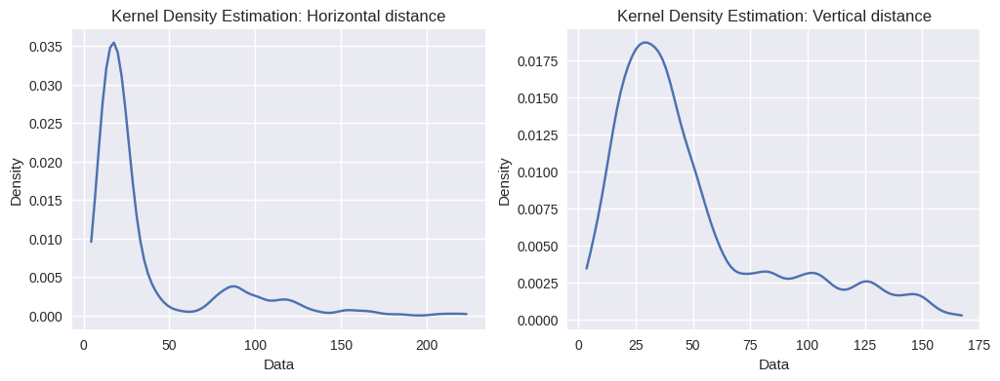

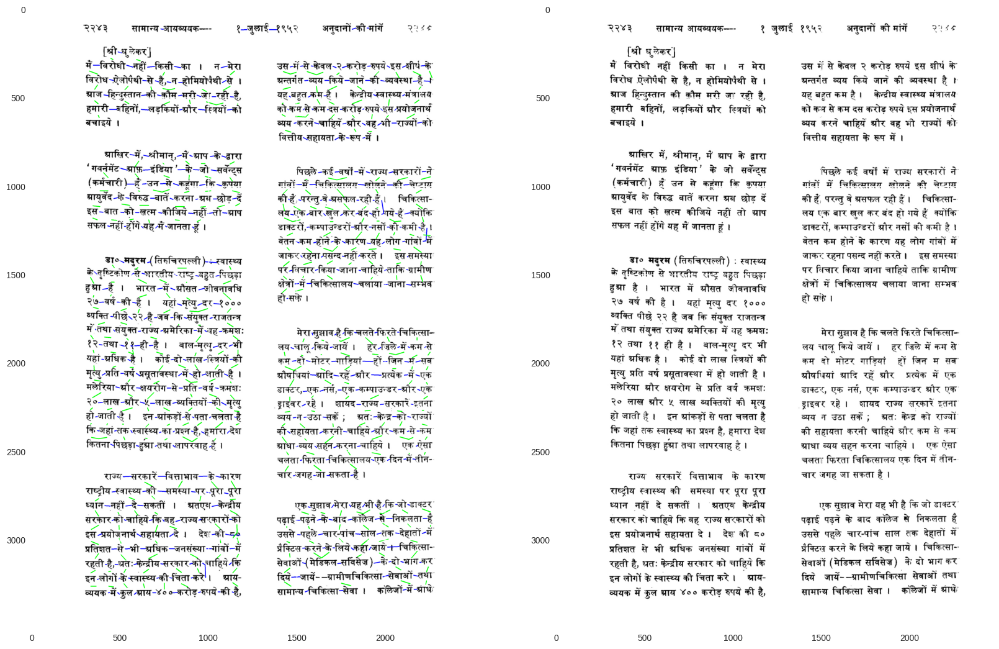

  0%|          | 0/498 [00:00<?, ?it/s]

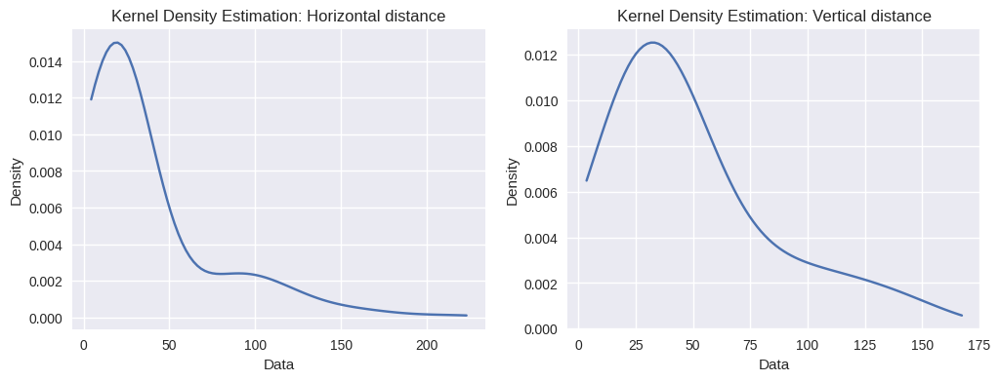

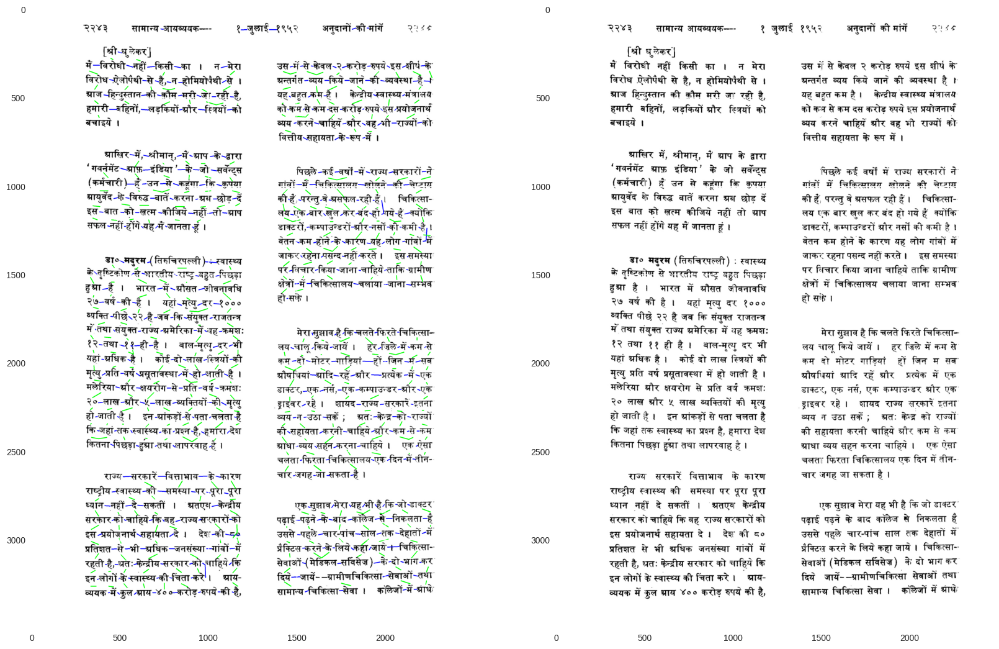

  0%|          | 0/498 [00:00<?, ?it/s]

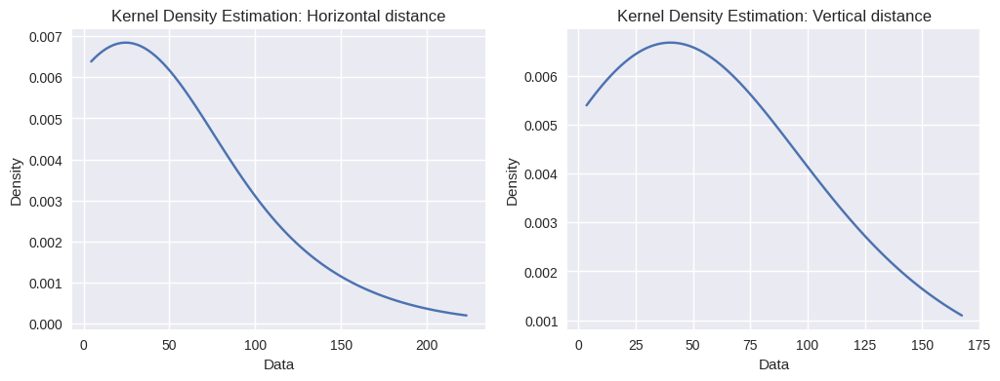

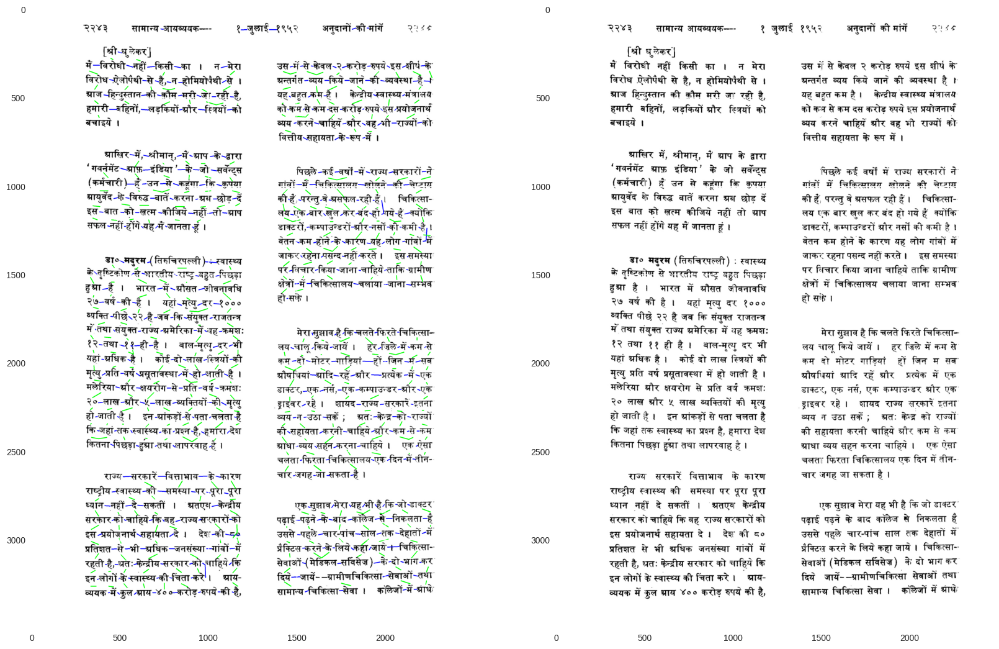

File: 145


0it [00:00, ?it/s]

Experimenting with different bandwidth values


  0%|          | 0/258 [00:00<?, ?it/s]

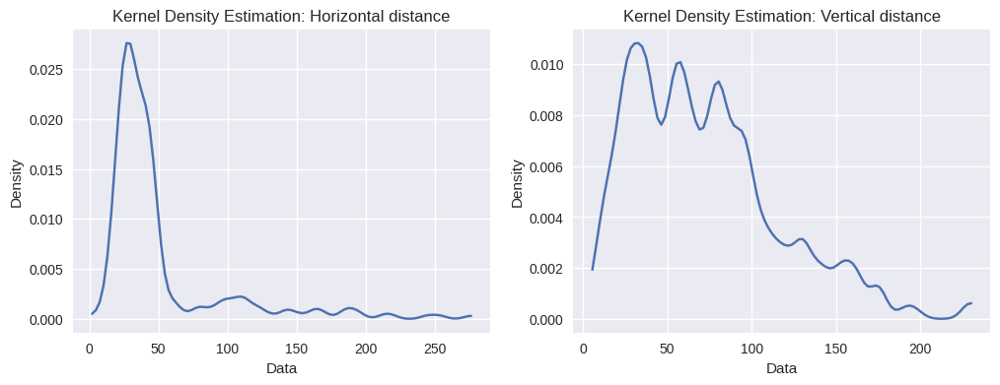

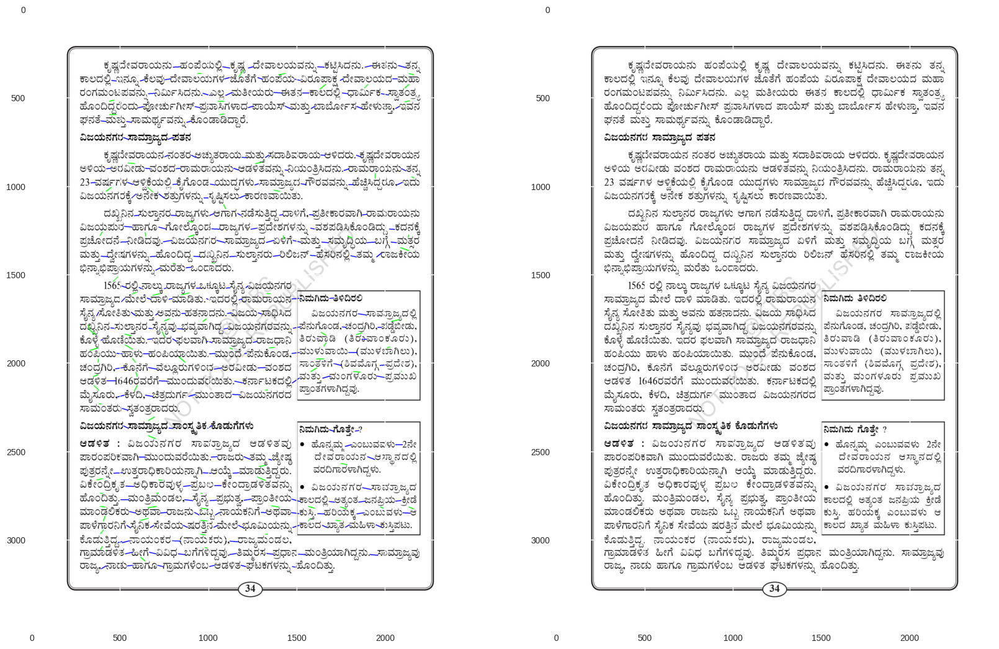

  0%|          | 0/258 [00:00<?, ?it/s]

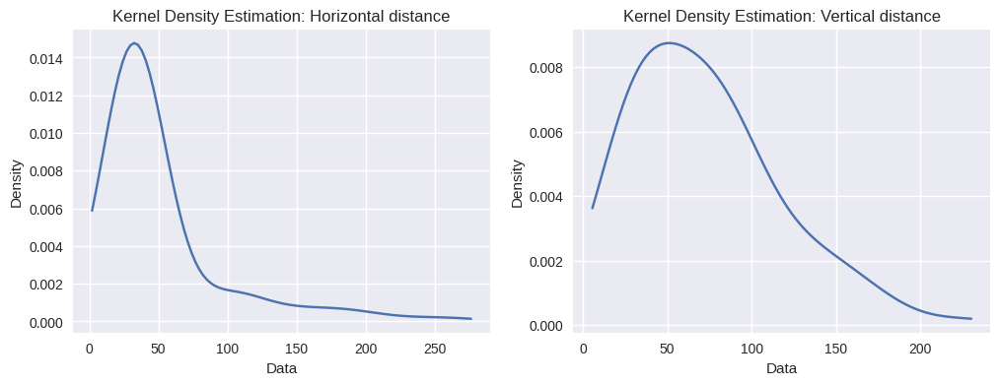

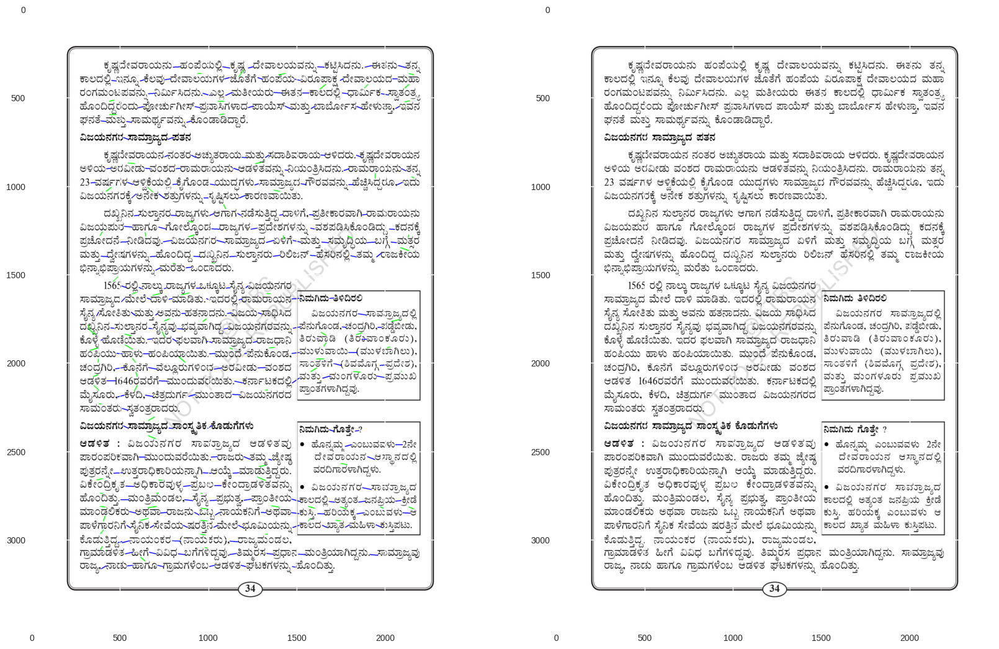

  0%|          | 0/258 [00:00<?, ?it/s]

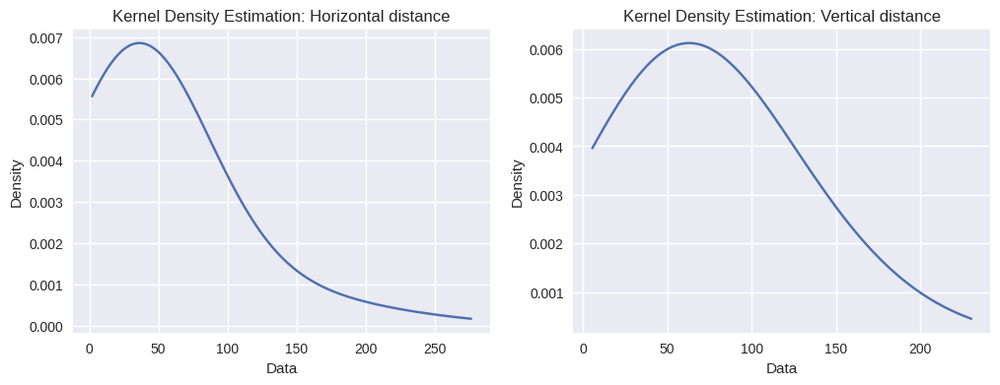

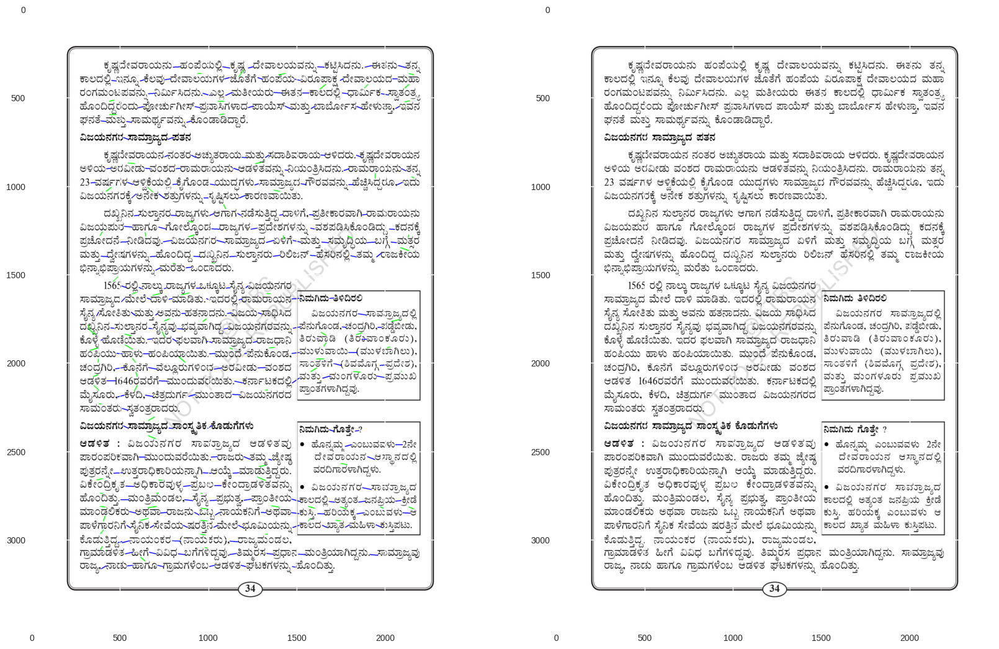

File: 201


0it [00:00, ?it/s]

Experimenting with different bandwidth values


  0%|          | 0/363 [00:00<?, ?it/s]

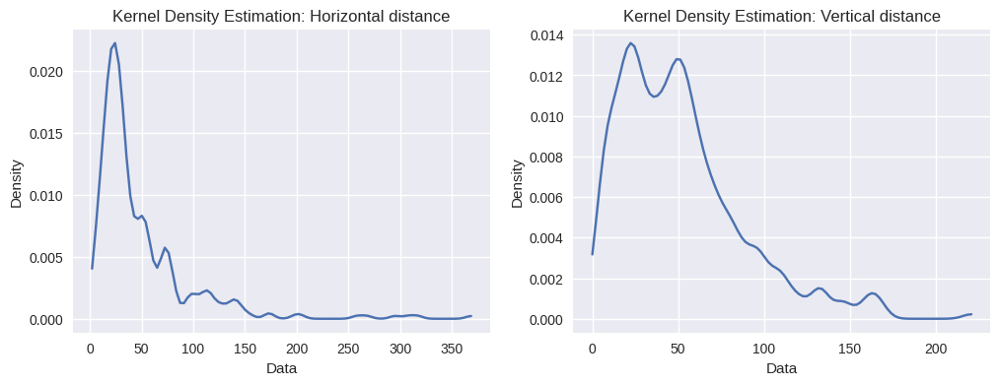

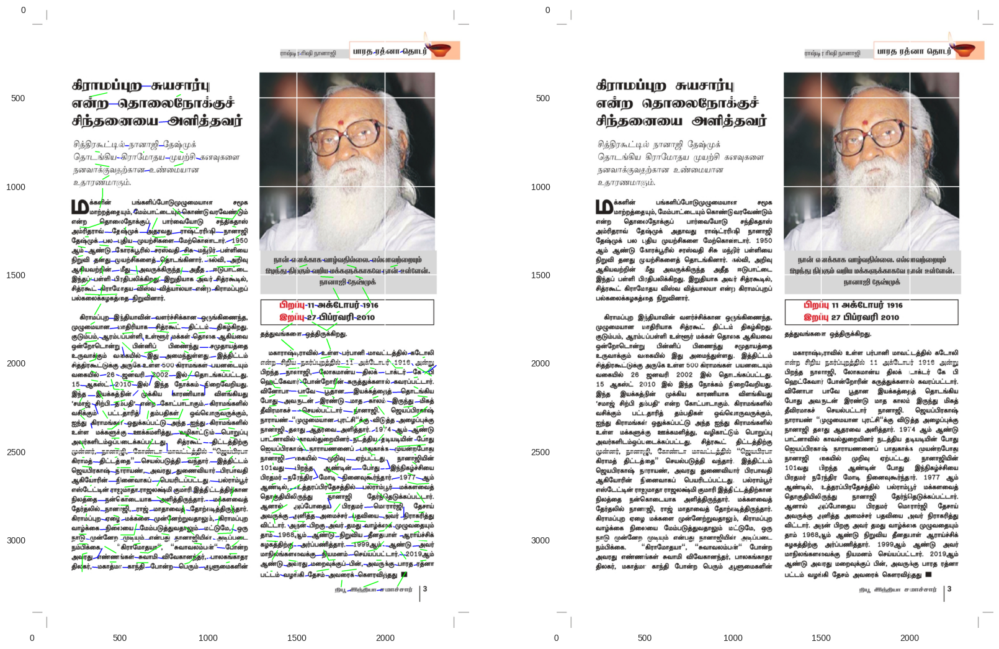

  0%|          | 0/363 [00:00<?, ?it/s]

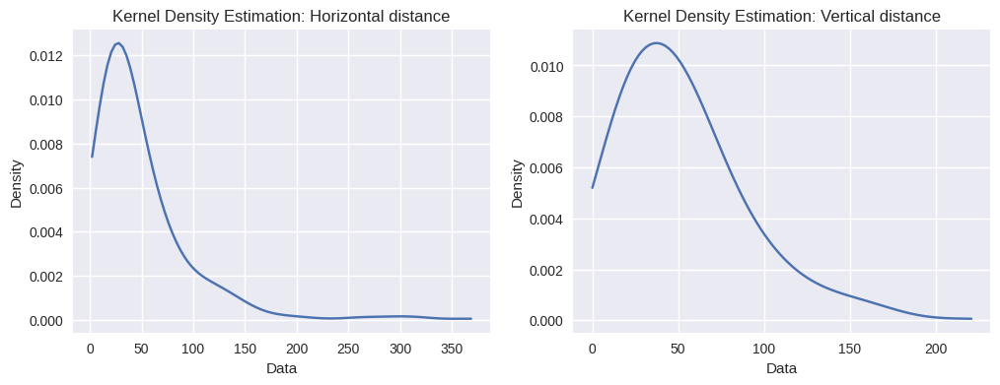

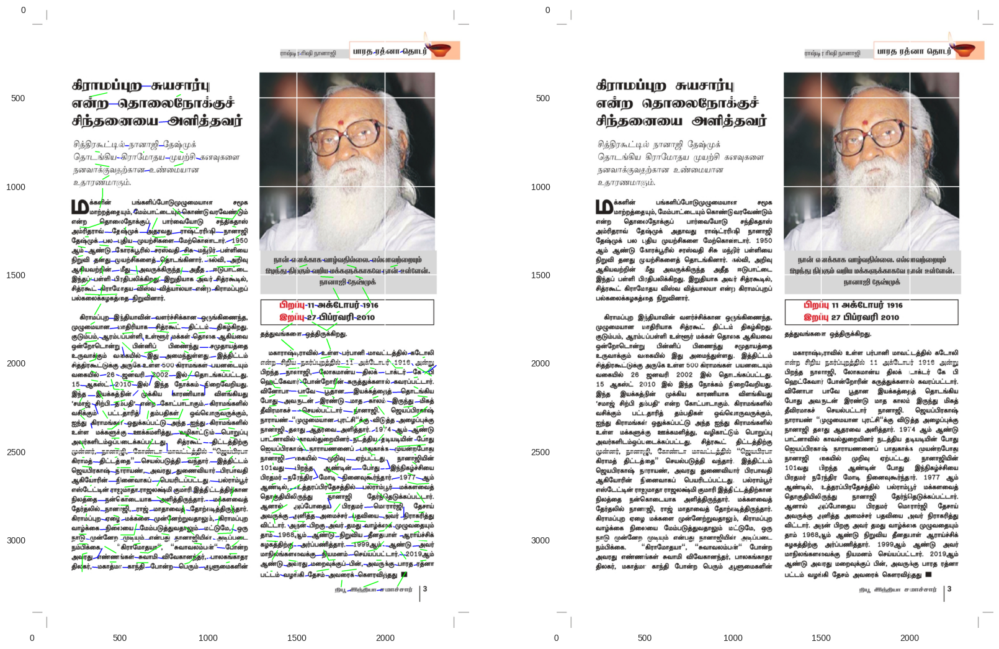

  0%|          | 0/363 [00:00<?, ?it/s]

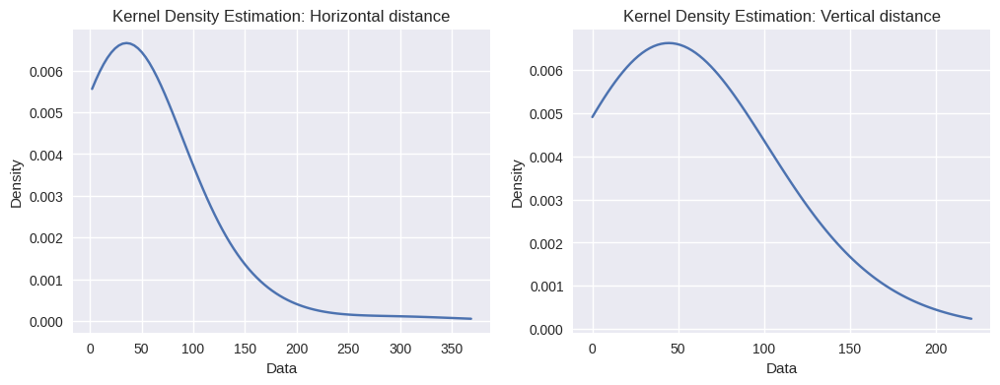

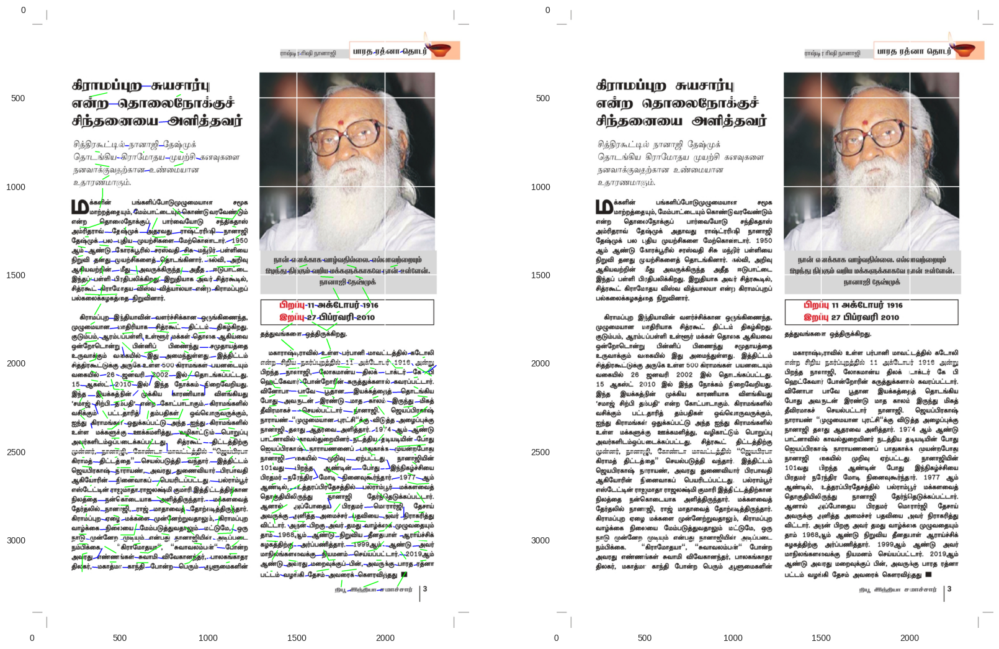

In [385]:
ver_tresholds_results = [50, 60, 50, 100]
hor_tresholds_results = [75, 75, 50, 60]


for i, idx in enumerate(['29', '68', '145', '201']):
    print(f"File: {idx}")
    df = pd.read_csv(f'./data/CSV/TLBR_{idx}.csv')
    img = plt.imread(f'./data/images/{idx}.jpg')
    img_boxes = visualize_bboxes(img, df, show=False)
    df['Top-Left'] = df['Top-Left'].apply(ast.literal_eval)
    df['Bottom-Right'] = df['Bottom-Right'].apply(ast.literal_eval)
    
    print("Experimenting with different bandwidth values")
    for band in [5, 20, 50]:
        visualize_results(df, img, ver_treshold=ver_tresholds_results[i], hor_treshold=hor_tresholds_results[i], bandwidth_range=[band])
        
    print("="*50)

### Final Results after obtaining optimal tresholds

File: 29


0it [00:00, ?it/s]

  0%|          | 0/432 [00:00<?, ?it/s]

/tmp/ipykernel_23758/2313881581.py:39: RuntimeWarning: divide by zero encountered in log
  likelihood += np.log(density)


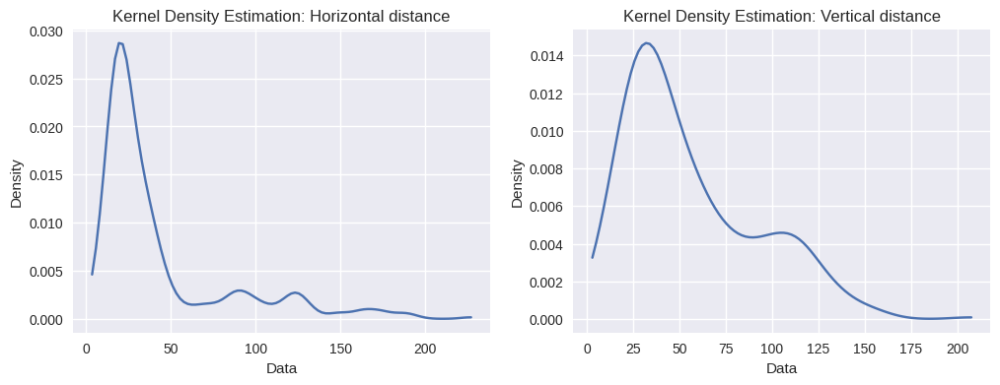

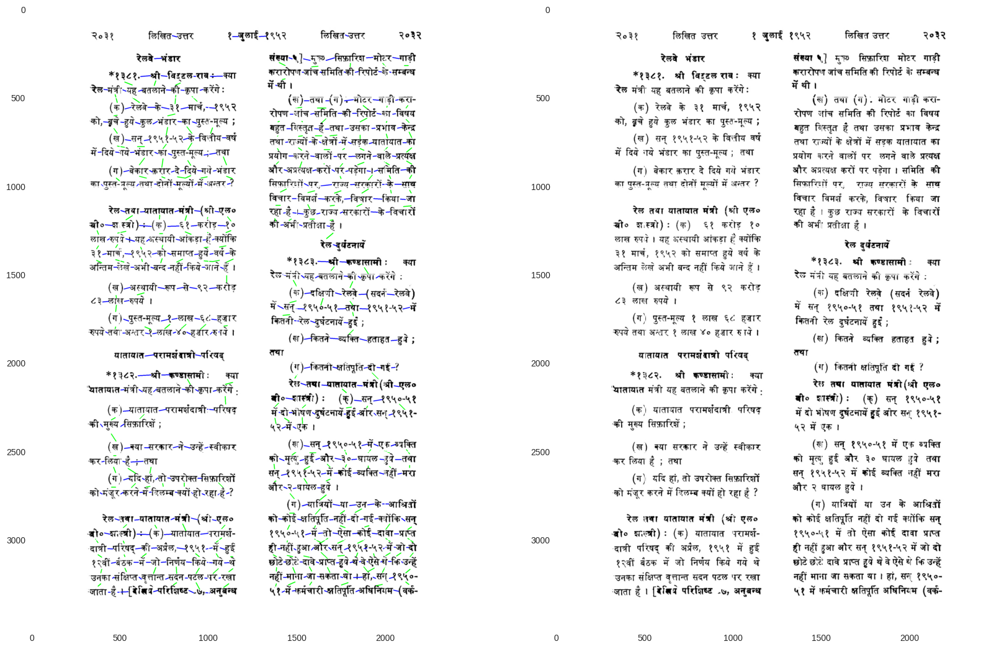

File: 68


0it [00:00, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

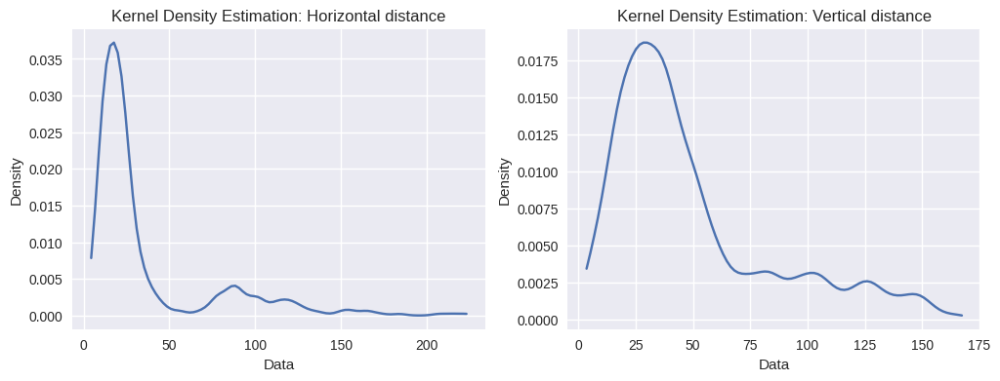

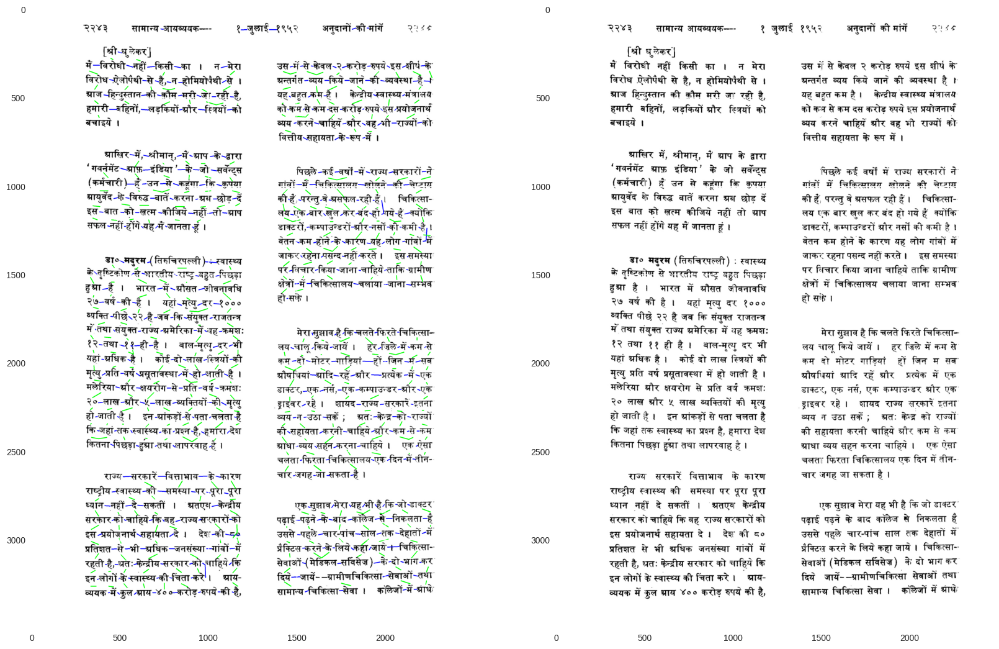

File: 145


0it [00:00, ?it/s]

  0%|          | 0/258 [00:00<?, ?it/s]

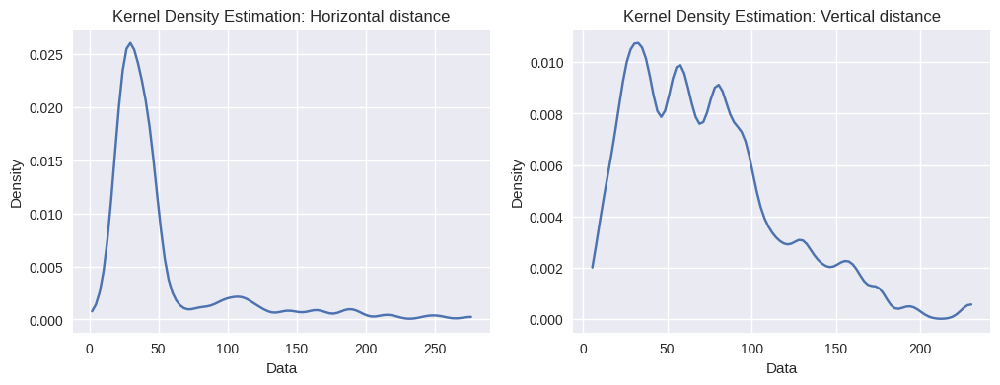

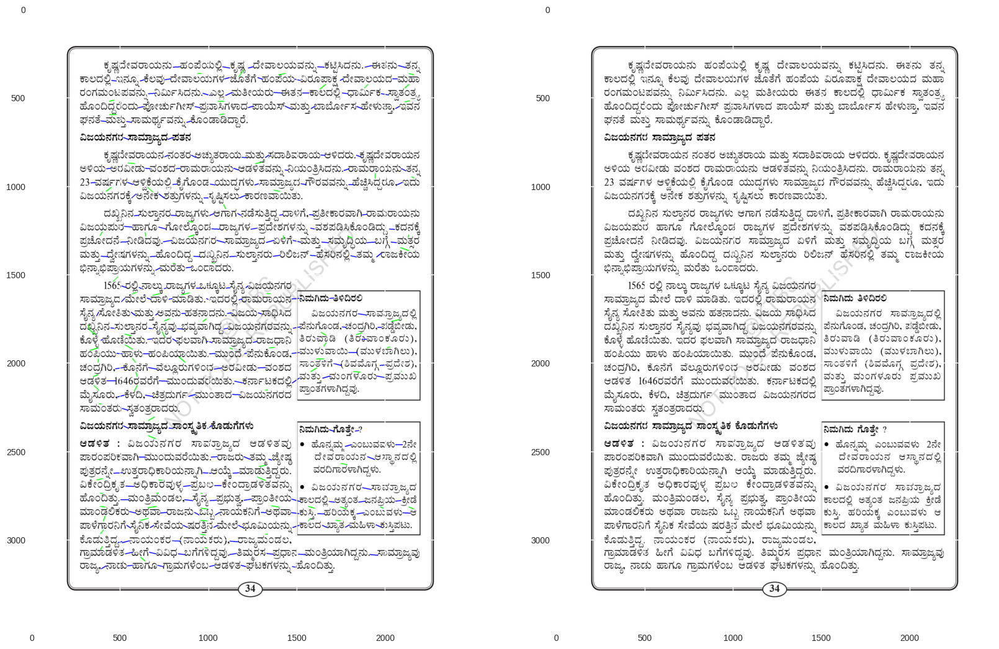

File: 201


0it [00:00, ?it/s]

  0%|          | 0/363 [00:00<?, ?it/s]

/tmp/ipykernel_23758/2313881581.py:39: RuntimeWarning: divide by zero encountered in log
  likelihood += np.log(density)


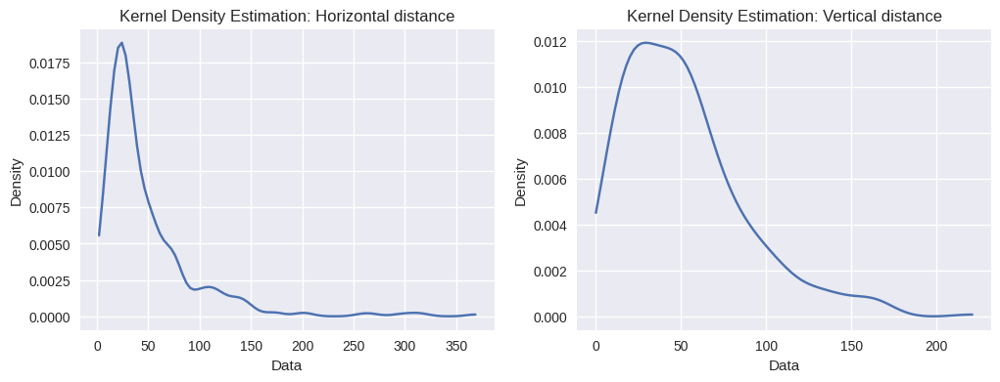

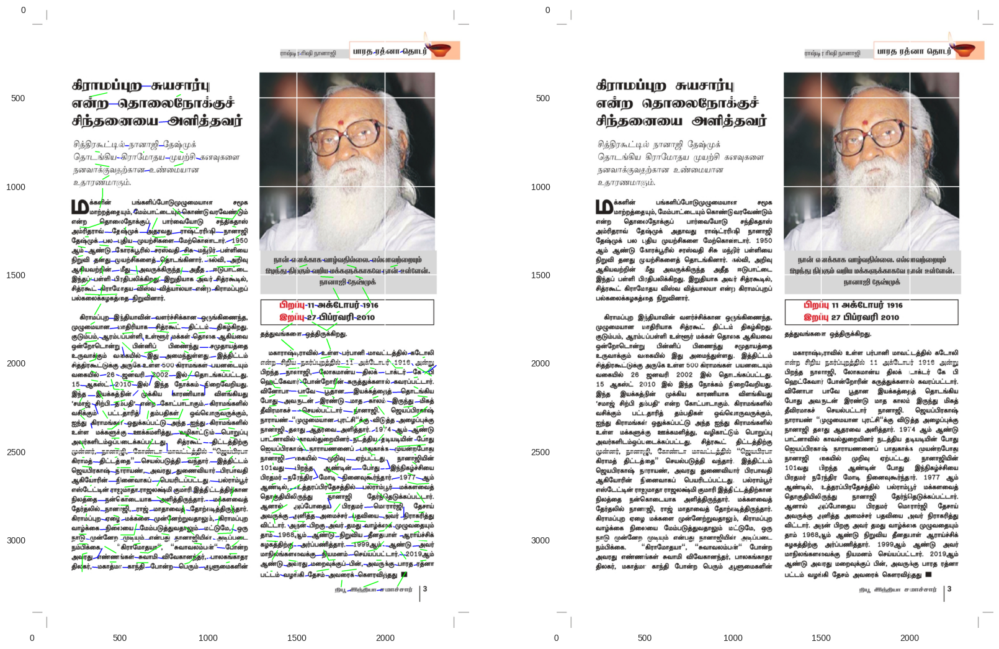

In [382]:
# obtained the results after analyzing the kde plots
ver_tresholds_results = [50, 60, 50, 100]
hor_tresholds_results = [75, 75, 50, 60]


for i, idx in enumerate(['29', '68', '145', '201']):
    print(f"File: {idx}")
    df = pd.read_csv(f'./data/CSV/TLBR_{idx}.csv')
    img = plt.imread(f'./data/images/{idx}.jpg')
    img_boxes = visualize_bboxes(img, df, show=False)
    df['Top-Left'] = df['Top-Left'].apply(ast.literal_eval)
    df['Bottom-Right'] = df['Bottom-Right'].apply(ast.literal_eval)
    
    visualize_results(df, img, ver_treshold=ver_tresholds_results[i], hor_treshold=hor_tresholds_results[i])
    

## 3.4 Hidden Markov Models

In [84]:
rolls = np.load('./data/rolls.npy')
rolls

array([[2],
       [0],
       [3],
       ...,
       [1],
       [3],
       [5]])

In [85]:
rolls_train, rolls_test = rolls[:25000], rolls[25000:]
rolls_train.shape, rolls_test.shape

((25000, 1), (25000, 1))

In [160]:
best_score = None
best_model = None
n_fits = 100
np.random.seed(13)

for idx in range(n_fits):
    model = hmm.CategoricalHMM(n_components=2, init_params='te', random_state=idx)  
    model.startprob_ = np.array([1.0, 0.0])
    
    model.fit(rolls_train)
    score = model.score(rolls_test)
    
    print(f'[Model: {idx}] [Score: {score}]')
    
    if best_score is None or score > best_score:
        best_model = model
        best_score = score

print(f'Best score: {best_score}')

[Model: 0] [Score: -43182.92152645113]
[Model: 1] [Score: -43174.51160366358]
[Model: 2] [Score: -43186.57318388813]
[Model: 3] [Score: -43190.351480900514]
[Model: 4] [Score: -43218.41729207446]
[Model: 5] [Score: -43173.6134089025]
[Model: 6] [Score: -43179.36235406709]
[Model: 7] [Score: -43192.935335172115]
[Model: 8] [Score: -43133.877107262146]
[Model: 9] [Score: -43191.17773770019]
[Model: 10] [Score: -43191.159801818794]
[Model: 11] [Score: -43100.49063396023]
[Model: 12] [Score: -43181.85233947469]
[Model: 13] [Score: -43182.39635128467]
[Model: 14] [Score: -43158.1006100391]
[Model: 15] [Score: -43154.593715807234]
[Model: 16] [Score: -43210.4601082571]
[Model: 17] [Score: -43167.2548066193]
[Model: 18] [Score: -43199.69356172805]
[Model: 19] [Score: -43190.450657253976]
[Model: 20] [Score: -43182.39405502736]
[Model: 21] [Score: -43224.657213102946]
[Model: 22] [Score: -43185.15941425001]
[Model: 23] [Score: -43217.13724767122]
[Model: 24] [Score: -43142.67117339888]
[Model:

In [161]:
states = best_model.predict(rolls_test)
states

array([0, 0, 0, ..., 0, 0, 0])

/tmp/ipykernel_23758/3262792972.py:7: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


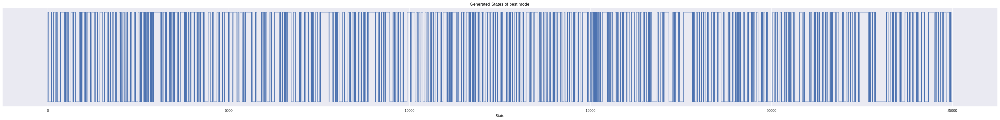

In [162]:
fig, ax = plt.subplots(figsize=(50, 5))
ax.plot(states)
ax.set_yticks([])
ax.set_title('Generated States of best model')
ax.set_xlabel('Time (# rolls)')
ax.set_xlabel('State')
fig.show()

**What problem in Hidden Markov Models does this task correspond to?**

Ans: The problem in Hidden Markov Models (HMMs) that corresponds to this task is often referred to as the "Decoding Problem." The Decoding Problem involves determining the most likely sequence of hidden states given the observed sequence of emissions. In this task of where a fair and loaded dice is given, it means we need to find the most probable sequence of switching between the fair and loaded states based on the observed outcomes.

In [93]:
transistion_matrix = best_model.transmat_
print("Transition Matrix of the best model: \n", transistion_matrix)

emission_matrix = best_model.emissionprob_
print("Emission Matrix of the best model: \n", emission_matrix)


Transition Matrix of the best model: 
 [[0.8598741  0.1401259 ]
 [0.13273368 0.86726632]]
Emission Matrix of the best model: 
 [[0.11662719 0.12255516 0.10979004 0.09612918 0.10685614 0.44804228]
 [0.15824997 0.15146495 0.16542901 0.17439937 0.17124683 0.17920987]]


### 3.4.3

**1. How often do you think the casino is switching out the fair die for the loaded one and vice versa?**

Ans: From the above emission matrix, we can observe that the fair die corresponds to index 1 and index 0 correspondes to loaded die. Now, we can see in the transition matrix the probability of going from fair die to loaded die 13%.

**2. What problem in Hidden Markov Models does this task correspond to?**

Ans: The above problem corresponds to Learning problem of HMM.

### 3.4.4

**1. How do you think the loaded die is biased?**

Ans: From the emission matrix, we can observe that the fair die has a higher probability of outputting the number 6, that is, P(6 | loaded) = 0.44

**2. What problem in Hidden Markov Models does this task correspond to?**

Ans: The above problem corresponds to Learning problem of HMM.

# 3.5 Task 4

In [94]:
runs = np.load('./data/runs.npy')
runs

array([[1],
       [6],
       [4],
       ...,
       [1],
       [6],
       [3]])

In [96]:
train_runs, test_runs = runs[:25000], runs[25000:]
train_runs.shape, test_runs.shape

((25000, 1), (5000, 1))

In [139]:
def virat_probs():
    probs = np.random.uniform(0, 1, 7)
    probs[1] += 1
    probs[2] += 1
    probs[5] = 0
    probs = probs/np.sum(probs)
    return probs


def rohit_probs():
    probs = np.random.uniform(0, 1, 7)
    probs[3] += 2
    probs[4] += 2
    probs[6] += 2
    probs[5] = 0
    probs = probs/np.sum(probs)
    return probs


best_score = best_model = None
n_fits = 100

np.random.seed(13)
for idx in range(n_fits):
    model = hmm.CategoricalHMM(
        n_components=2,
        init_params='s', algorithm='viterbi', random_state=idx)  

    prob = np.random.uniform(low=0.25, high=0.35)
    model.transmat_ = np.array([[1-prob, prob], [prob, 1-prob]])
    model.emissionprob_ = np.array([virat_probs(), rohit_probs()])

    model.fit(train_runs)
    score = model.score(test_runs)
    print(f'[Model {idx}] [Score: {score}]')
    if best_score is None or score > best_score:
        best_model = model
        best_score = score

print(f'Best score: {best_score}')

[Model 0] [Score: -8519.749091886453]
[Model 1] [Score: -8521.169031857406]
[Model 2] [Score: -8522.922005395856]
[Model 3] [Score: -8520.561745153667]
[Model 4] [Score: -8520.51890894264]
[Model 5] [Score: -8522.44556579877]
[Model 6] [Score: -8512.119491616495]
[Model 7] [Score: -8521.282532272488]
[Model 8] [Score: -8524.25134254559]
[Model 9] [Score: -8511.831063905061]
[Model 10] [Score: -8515.090128744416]
[Model 11] [Score: -8520.08730325355]
[Model 12] [Score: -8513.732167391816]
[Model 13] [Score: -8516.596805979954]
[Model 14] [Score: -8516.60792812929]
[Model 15] [Score: -8517.102267023693]
[Model 16] [Score: -8518.379281003556]
[Model 17] [Score: -8520.322655175984]
[Model 18] [Score: -8512.344940380237]
[Model 19] [Score: -8521.402863540345]
[Model 20] [Score: -8513.71184377379]
[Model 21] [Score: -8513.70348635785]
[Model 22] [Score: -8515.829748557604]
[Model 23] [Score: -8513.34463865399]
[Model 24] [Score: -8519.474033087994]
[Model 25] [Score: -8515.127952405317]
[Mod

In [140]:
print("Optimal transition matrix:\n", best_model.transmat_)
print("Optimal emission matrix:\n", best_model.emissionprob_)
print("Optimal start probability:\n", best_model.startprob_)

Optimal transition matrix:
 [[0.7342814  0.2657186 ]
 [0.33120372 0.66879628]]
Optimal emission matrix:
 [[0.17263873 0.28330609 0.23772479 0.0373355  0.14153141 0.
  0.12746348]
 [0.06642452 0.09435724 0.10202218 0.06066484 0.39347925 0.
  0.28305198]]
Optimal start probability:
 [9.99735292e-01 2.64707738e-04]


In [137]:
batsman = best_model.predict(runs)

print("First ball:", "Virat" if batsman[0] == 0 else "Rohit")
print("Last ball:", "Virat" if batsman[-1] == 0 else "Rohit")

First ball: Virat
Last ball: Rohit
